In [61]:
import json
import os
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [62]:
SD_BASE = {}
JPEG_AND_AES = {}
AESTH = {}
JPEG = {}

In [63]:
path = "/home/ayagolubkova/rl_project/ddpo-pytorch/eval/benchmark/runs"
dir_w_evl = os.listdir(path)

In [64]:
def classify_run(dirname: str) -> str:
    if dirname == "sd_base" or dirname.startswith("sd_base"):
        return "sd_base"
    if "jp_and_aes" in dirname or dirname.startswith("jp_and_aes"):
        return "jpeg_aes"
    if dirname.startswith("aesth"):
        return "aesth"
    if dirname.startswith("jpeg"):
        return "jpeg"
    return "other"


for dir_ in sorted(dir_w_evl):
    results_path = os.path.join(path, dir_, "results.json")
    if not os.path.isfile(results_path):
        continue
    with open(results_path, encoding="utf-8") as f:
        res = json.load(f)
    summary = res["summary"]
    bucket = classify_run(dir_)
    if bucket == "sd_base":
        SD_BASE[dir_] = summary
    elif bucket == "jpeg_aes":
        JPEG_AND_AES[dir_] = summary
    elif bucket == "aesth":
        AESTH[dir_] = summary
    elif bucket == "jpeg":
        JPEG[dir_] = summary

In [65]:
{"SD_BASE": list(SD_BASE), "JPEG_AND_AES": list(JPEG_AND_AES), "JPEG": list(JPEG), "AESTH": list(AESTH)}

{'SD_BASE': ['sd_base'],
 'JPEG_AND_AES': ['jp_and_aes_5',
  'jp_and_aes_6',
  'jp_and_aes_7',
  'jp_and_aes_8',
  'jp_and_aes_9'],
 'JPEG': ['jpeg_compr_5',
  'jpeg_compr_6',
  'jpeg_compr_7',
  'jpeg_compr_8',
  'jpeg_compr_9'],
 'AESTH': ['aesth_5', 'aesth_6', 'aesth_7', 'aesth_8', 'aesth_9']}

In [66]:
def mean_or_nan(summary: dict, key: str) -> float:
    block = summary.get(key) or {}
    m = block.get("mean")
    return float(m) if m is not None else float("nan")


def best_run_by_aesthetic(runs: dict) -> tuple:
    if not runs:
        return None, float("nan")
    best_name, best_v = None, float("-inf")
    for name, summ in runs.items():
        v = mean_or_nan(summ, "aesthetic")
        if not np.isnan(v) and v > best_v:
            best_v, best_name = v, name
    return best_name, best_v


best_jp_aes, v_jp_aes = best_run_by_aesthetic(JPEG_AND_AES)
best_jpeg, v_jpeg = best_run_by_aesthetic(JPEG)
best_aesth, v_aesth = best_run_by_aesthetic(AESTH)

print("Лучший по aesthetic.mean:")
print(f"  jpeg + aesthetic: checkpoint {best_jp_aes.split('_')[-1]} -> {v_jp_aes:.4f}")
print(f"  jpeg only:        checkpoint {best_jpeg.split('_')[-1]} -> {v_jpeg:.4f}")
print(f"  aesthetic only:   checkpoint {best_aesth.split('_')[-1]} -> {v_aesth:.4f}")

report_dir = Path("/home/ayagolubkova/rl_project/ddpo-pytorch/report")
report_dir.mkdir(parents=True, exist_ok=True)
sd_out = report_dir / "sd_base_summary.json"
if SD_BASE:
    key = "sd_base" if "sd_base" in SD_BASE else next(iter(SD_BASE))
    sd_out.write_text(
        json.dumps({"run_dir": key, "summary": SD_BASE[key]}, ensure_ascii=False, indent=2),
        encoding="utf-8",
    )
    print(f"Wrote {sd_out}")
else:
    print("SD_BASE пуст — нет папки sd_base под runs/")

Лучший по aesthetic.mean:
  jpeg + aesthetic: checkpoint 9 -> 5.6964
  jpeg only:        checkpoint 5 -> 5.4612
  aesthetic only:   checkpoint 9 -> 5.7920
Wrote /home/ayagolubkova/rl_project/ddpo-pytorch/report/sd_base_summary.json


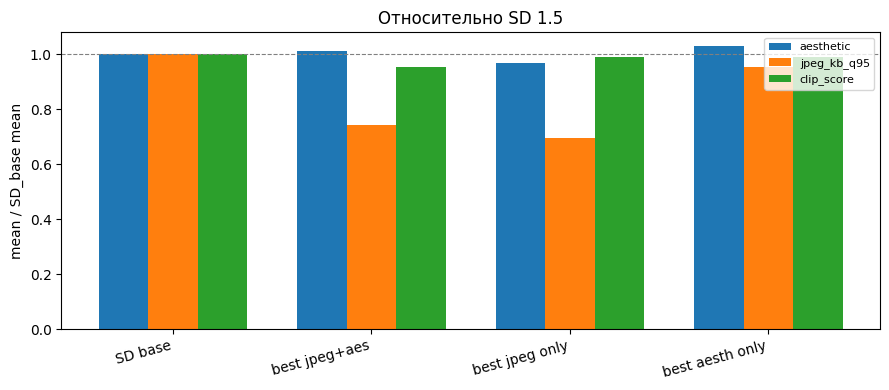

,aesthetic,jpeg_kb_q95,clip_score,run_folder
SD base,5.635403,120.186920,0.269367,sd_base
best jpeg+aes,5.696423,88.999345,0.256823,jp_and_aes_9
best jpeg only,5.461196,83.368920,0.266657,jpeg_compr_5
best aesth only,5.792036,114.689736,0.266307,aesth_9


In [67]:

def triple_from_summary(summ: dict) -> np.ndarray:
    return np.array(
        [
            mean_or_nan(summ, "aesthetic"),
            mean_or_nan(summ, "jpeg_kb_q95"),
            mean_or_nan(summ, "clip_score"),
        ],
        dtype=float,
    )


if not SD_BASE:
    raise RuntimeError("Нужен SD_BASE: папка sd_base с results.json под runs/")

baseline_key = "sd_base" if "sd_base" in SD_BASE else next(iter(SD_BASE))
base_summ = SD_BASE[baseline_key]
base_triple = triple_from_summary(base_summ)

models = [
    ("SD base", baseline_key, base_summ),
    ("best jpeg+aes", best_jp_aes, JPEG_AND_AES.get(best_jp_aes) if best_jp_aes else None),
    ("best jpeg only", best_jpeg, JPEG.get(best_jpeg) if best_jpeg else None),
    ("best aesth only", best_aesth, AESTH.get(best_aesth) if best_aesth else None),
]

labels = []
rel_rows = []
raw_rows = []
for disp, _run_name, summ in models:
    labels.append(disp)
    if summ is None:
        rel_rows.append([np.nan, np.nan, np.nan])
        raw_rows.append([np.nan, np.nan, np.nan])
        continue
    raw = triple_from_summary(summ)
    raw_rows.append(raw)
    with np.errstate(divide="ignore", invalid="ignore"):
        rel = raw / base_triple
    rel_rows.append(rel)

rel = np.array(rel_rows, dtype=float)
raw = np.array(raw_rows, dtype=float)

metric_names = ["aesthetic", "jpeg_kb_q95", "clip_score"]
x = np.arange(len(labels))
width = 0.25
fig, ax = plt.subplots(figsize=(9, 4))
for i, mname in enumerate(metric_names):
    ax.bar(x + (i - 1) * width, rel[:, i], width, label=mname)

ax.axhline(1.0, color="gray", ls="--", lw=0.8)
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=15, ha="right")
ax.set_ylabel("mean / SD_base mean")
ax.set_title("Относительно SD 1.5")
ax.legend(loc="upper right", fontsize=8)
plt.tight_layout()
plt.savefig(report_dir / "benchmark_four_models_grouped.png", dpi=150)
plt.show()

_df = pd.DataFrame(raw, index=labels, columns=metric_names)
_df["run_folder"] = [m[1] for m in models]
_df


JPEG + aesthetic


,run,aesthetic,jpeg_kb_q95,clip_score,aesthetic_vs_sd,jpeg_kb_vs_sd,clip_vs_sd,best_by_aesthetic
0,jp_and_aes_5,5.638913,102.099897,0.268235,1.000623,0.849509,0.995798,False
1,jp_and_aes_6,5.651664,96.849253,0.263597,1.002886,0.805822,0.978579,False
2,jp_and_aes_7,5.673630,91.391000,0.267596,1.006783,0.760407,0.993424,False
3,jp_and_aes_8,5.566897,100.452701,0.223145,0.987844,0.835804,0.828405,False
4,jp_and_aes_9,5.696423,88.999345,0.256823,1.010828,0.740508,0.953432,True


saved: /home/ayagolubkova/rl_project/ddpo-pytorch/report/benchmark_checkpoints_jpeg_aes.csv

JPEG only


,run,aesthetic,jpeg_kb_q95,clip_score,aesthetic_vs_sd,jpeg_kb_vs_sd,clip_vs_sd,best_by_aesthetic
0,jpeg_compr_5,5.461196,83.368920,0.266657,0.969087,0.693661,0.989939,True
1,jpeg_compr_6,5.410948,78.634356,0.255969,0.960171,0.654267,0.950262,False
2,jpeg_compr_7,4.777838,40.756172,0.210057,0.847826,0.339107,0.779815,False
3,jpeg_compr_8,4.308566,26.798724,0.195920,0.764553,0.222975,0.727333,False
4,jpeg_compr_9,3.863013,19.292057,0.163637,0.685490,0.160517,0.607486,False


saved: /home/ayagolubkova/rl_project/ddpo-pytorch/report/benchmark_checkpoints_jpeg_only.csv

Aesthetic only


,run,aesthetic,jpeg_kb_q95,clip_score,aesthetic_vs_sd,jpeg_kb_vs_sd,clip_vs_sd,best_by_aesthetic
0,aesth_5,5.670289,113.239460,0.261637,1.006191,0.942195,0.971302,False
1,aesth_6,5.737152,115.099023,0.258799,1.018055,0.957667,0.960767,False
2,aesth_7,5.747787,117.816207,0.254280,1.019943,0.980275,0.943989,False
3,aesth_8,5.717318,116.974690,0.265716,1.014536,0.973273,0.986444,False
4,aesth_9,5.792036,114.689736,0.266307,1.027794,0.954261,0.988639,True


saved: /home/ayagolubkova/rl_project/ddpo-pytorch/report/benchmark_checkpoints_aesth_only.csv


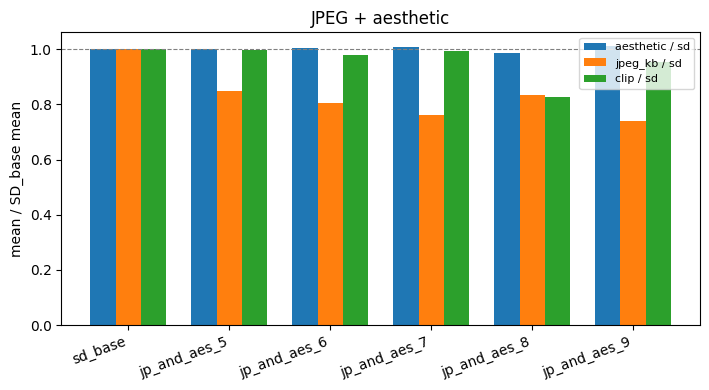

/home/ayagolubkova/rl_project/ddpo-pytorch/report/benchmark_checkpoints_jpeg_aes.png


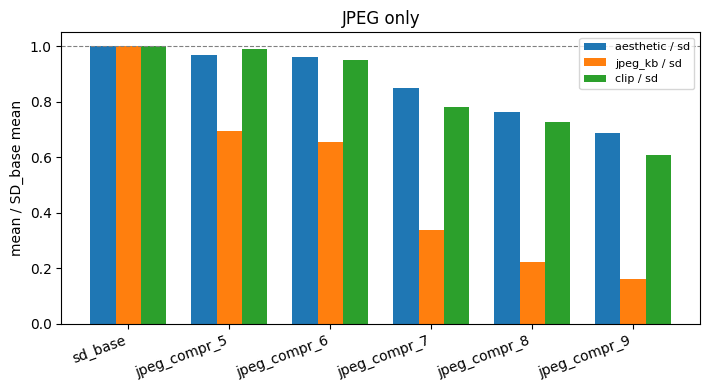

/home/ayagolubkova/rl_project/ddpo-pytorch/report/benchmark_checkpoints_jpeg_only.png


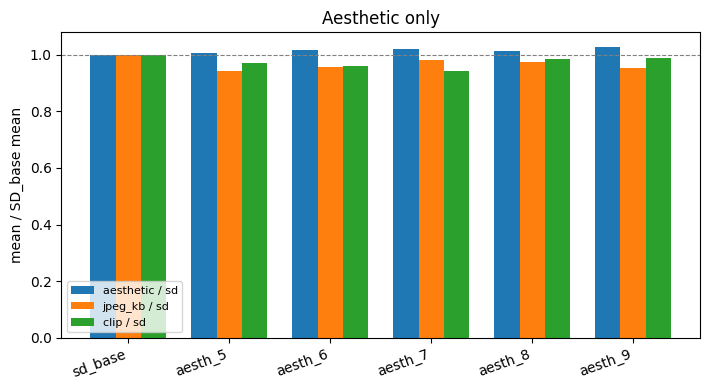

/home/ayagolubkova/rl_project/ddpo-pytorch/report/benchmark_checkpoints_aesth_only.png


In [68]:
import re

def natural_sort_key(dirname: str):
    m = re.search(r"(\d+)$", dirname)
    return (int(m.group(1)) if m else 0, dirname)


def family_comparison_table(runs: dict, base_triple: np.ndarray) -> pd.DataFrame:
    """По всем чекпоинтам одного семейства: сырые mean и отношение к SD base."""
    if not runs:
        return pd.DataFrame()
    rows = []
    for name in sorted(runs.keys(), key=natural_sort_key):
        summ = runs[name]
        raw = triple_from_summary(summ)
        with np.errstate(divide="ignore", invalid="ignore"):
            rel = raw / base_triple
        rows.append(
            {
                "run": name,
                "aesthetic": raw[0],
                "jpeg_kb_q95": raw[1],
                "clip_score": raw[2],
                "aesthetic_vs_sd": rel[0],
                "jpeg_kb_vs_sd": rel[1],
                "clip_vs_sd": rel[2],
            }
        )
    df = pd.DataFrame(rows)
    if df["aesthetic"].notna().any():
        df["best_by_aesthetic"] = df["aesthetic"] == df["aesthetic"].max()
    else:
        df["best_by_aesthetic"] = False
    return df


families = [
    ("jpeg_aes", "JPEG + aesthetic", JPEG_AND_AES),
    ("jpeg_only", "JPEG only", JPEG),
    ("aesth_only", "Aesthetic only", AESTH),
]

all_tables = {}
for key, title, runs in families:
    df = family_comparison_table(runs, base_triple)
    all_tables[key] = df
    print(f"\n{'=' * 60}\n{title}\n{'=' * 60}")
    if df.empty:
        print("(нет папок с results.json)")
        continue
    display(df)
    csv_path = report_dir / f"benchmark_checkpoints_{key}.csv"
    df.to_csv(csv_path, index=False)
    print(f"saved: {csv_path}")

for key, title, runs in families:
    df = all_tables[key]
    if df.empty:
        continue
    sd_label = baseline_key
    labels_ckpt = [sd_label] + df["run"].tolist()
    y_aes = np.r_[1.0, df["aesthetic_vs_sd"].to_numpy()]
    y_jpg = np.r_[1.0, df["jpeg_kb_vs_sd"].to_numpy()]
    y_clip = np.r_[1.0, df["clip_vs_sd"].to_numpy()]
    n = len(labels_ckpt)
    x = np.arange(n)
    w = 0.25
    fig, ax = plt.subplots(figsize=(max(6, 1.2 * n), 4))
    ax.bar(x - w, y_aes, w, label="aesthetic / sd")
    ax.bar(x, y_jpg, w, label="jpeg_kb / sd")
    ax.bar(x + w, y_clip, w, label="clip / sd")
    ax.axhline(1.0, color="gray", ls="--", lw=0.8)
    ax.set_xticks(x)
    ax.set_xticklabels(labels_ckpt, rotation=20, ha="right")
    ax.set_ylabel("mean / SD_base mean")
    ax.set_title(title)
    ax.legend(fontsize=8)
    plt.tight_layout()
    fig_path = report_dir / f"benchmark_checkpoints_{key}.png"
    plt.savefig(fig_path, dpi=150)
    plt.show()
    print(fig_path)


In [69]:
name_of_run = {
    'jp_and_aes_5': 'JPEG + aesthetic 5',
    'jp_and_aes_6': 'JPEG + aesthetic 6',
    'jp_and_aes_7': 'JPEG + aesthetic 7',
    'jp_and_aes_8': 'JPEG + aesthetic 8',
    'jp_and_aes_9': 'JPEG + aesthetic 9',
    'jpeg_compr_5': 'JPEG compression 5',
    'jpeg_compr_6': 'JPEG compression 6',
    'jpeg_compr_7': 'JPEG compression 7',
    'jpeg_compr_8': 'JPEG compression 8',
    'jpeg_compr_9': 'JPEG compression 9',
    'aesth_5': 'Aesthetic 5',
    'aesth_6': 'Aesthetic 6',
    'aesth_7': 'Aesthetic 7',
    'aesth_8': 'Aesthetic 8',
    'aesth_9': 'Aesthetic 9',
    'sd_base': 'SD base',
    
}

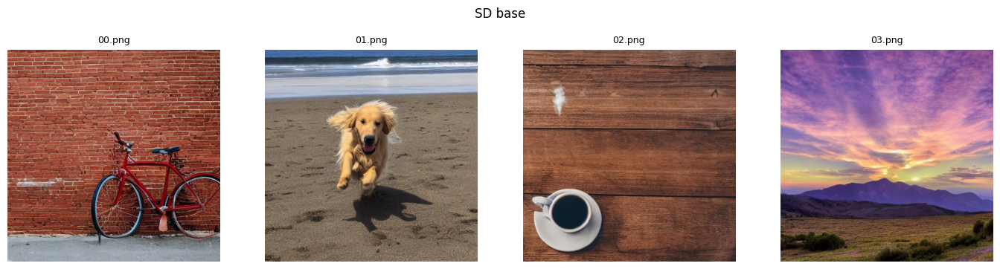

/home/ayagolubkova/rl_project/ddpo-pytorch/report/preview_grids/sd_base_previews.png


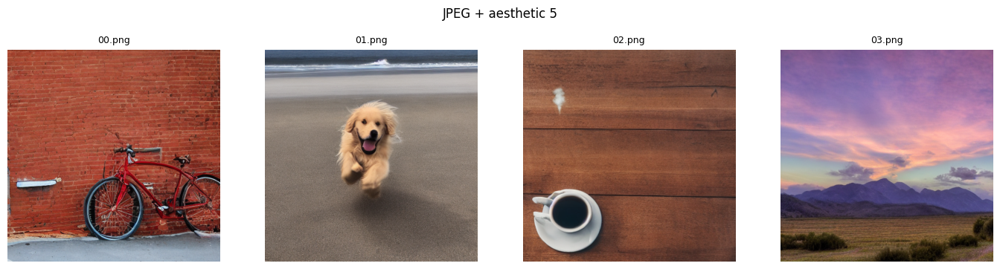

/home/ayagolubkova/rl_project/ddpo-pytorch/report/preview_grids/jp_and_aes_5_previews.png


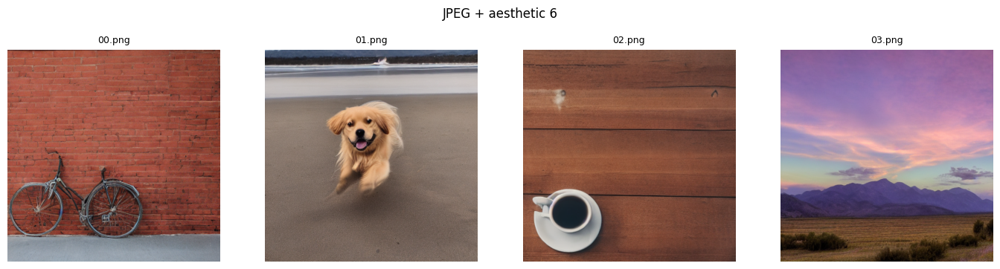

/home/ayagolubkova/rl_project/ddpo-pytorch/report/preview_grids/jp_and_aes_6_previews.png


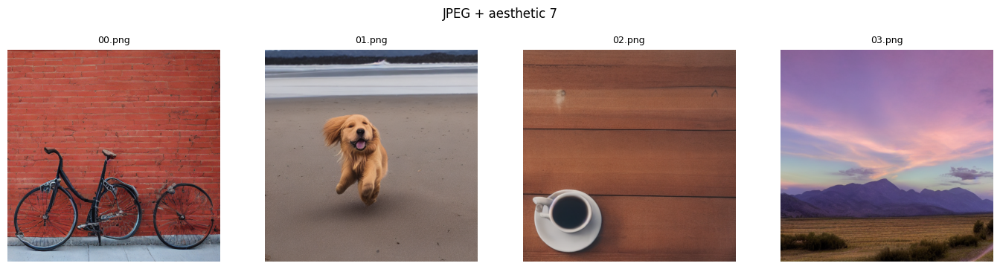

/home/ayagolubkova/rl_project/ddpo-pytorch/report/preview_grids/jp_and_aes_7_previews.png


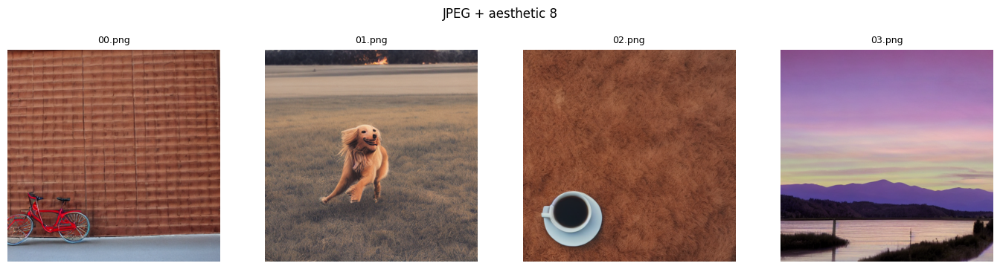

/home/ayagolubkova/rl_project/ddpo-pytorch/report/preview_grids/jp_and_aes_8_previews.png


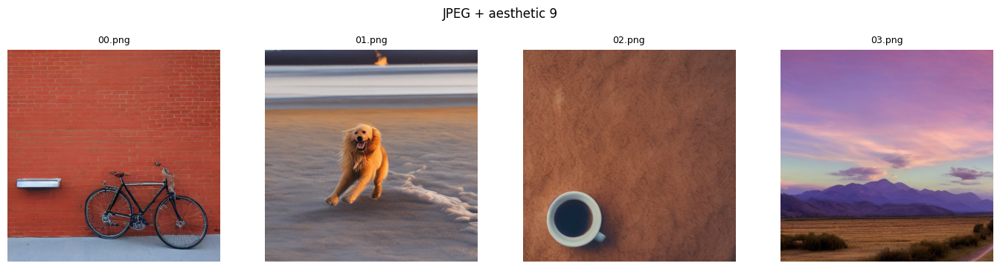

/home/ayagolubkova/rl_project/ddpo-pytorch/report/preview_grids/jp_and_aes_9_previews.png


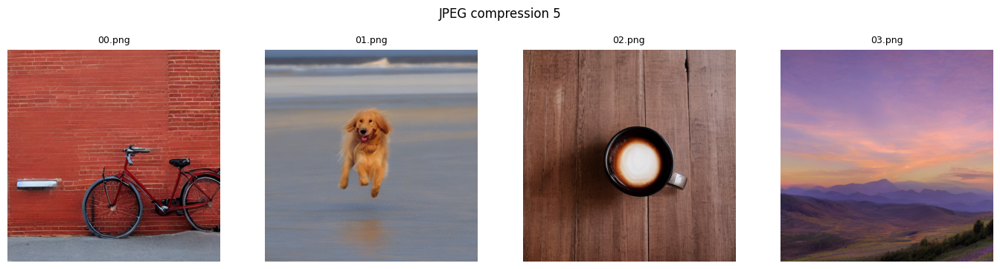

/home/ayagolubkova/rl_project/ddpo-pytorch/report/preview_grids/jpeg_compr_5_previews.png


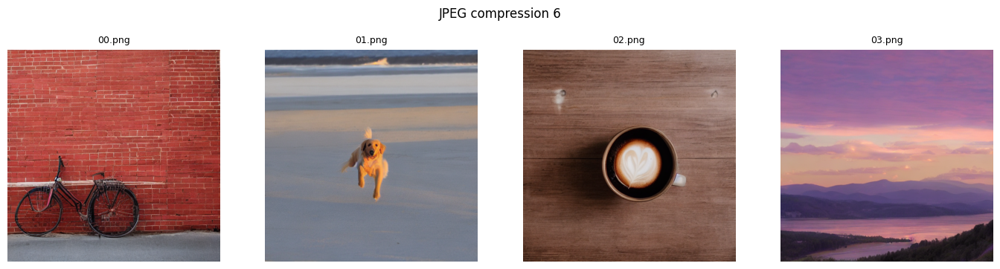

/home/ayagolubkova/rl_project/ddpo-pytorch/report/preview_grids/jpeg_compr_6_previews.png


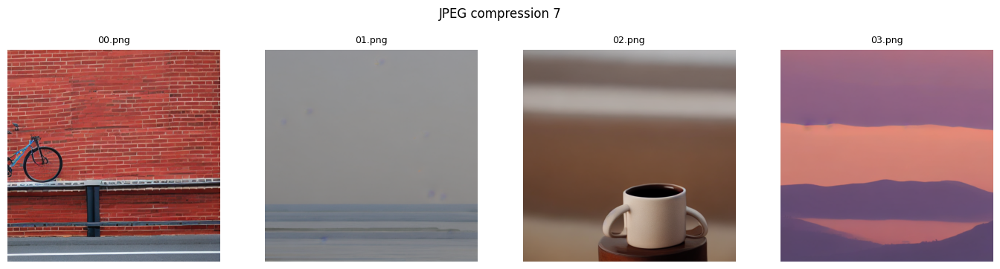

/home/ayagolubkova/rl_project/ddpo-pytorch/report/preview_grids/jpeg_compr_7_previews.png


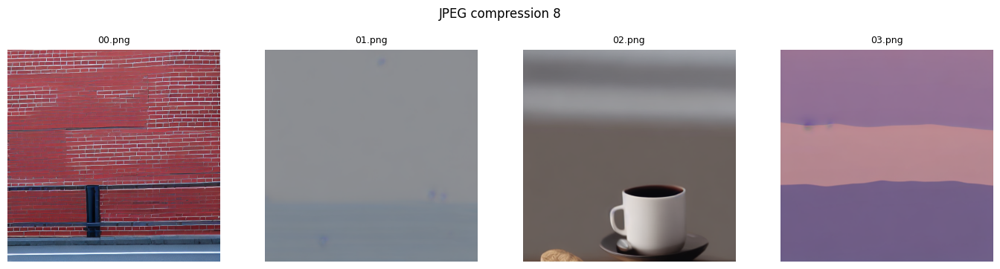

/home/ayagolubkova/rl_project/ddpo-pytorch/report/preview_grids/jpeg_compr_8_previews.png


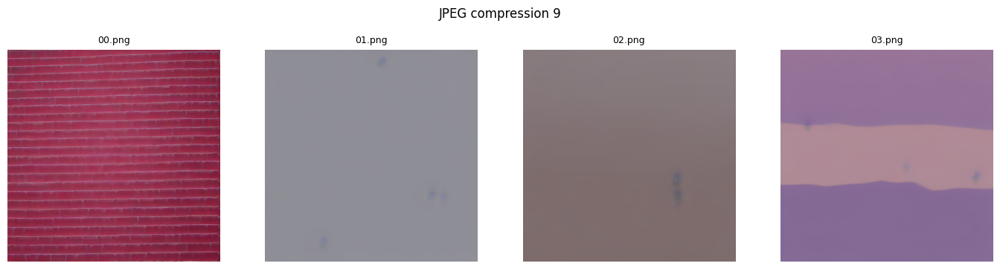

/home/ayagolubkova/rl_project/ddpo-pytorch/report/preview_grids/jpeg_compr_9_previews.png


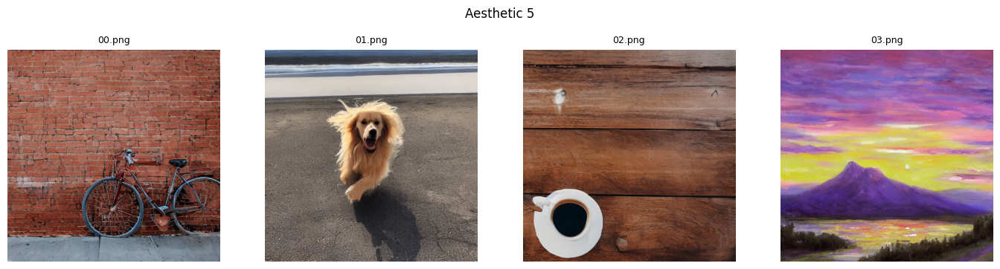

/home/ayagolubkova/rl_project/ddpo-pytorch/report/preview_grids/aesth_5_previews.png


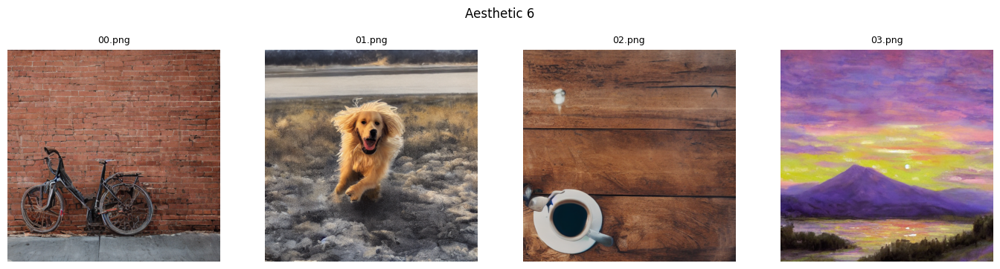

/home/ayagolubkova/rl_project/ddpo-pytorch/report/preview_grids/aesth_6_previews.png


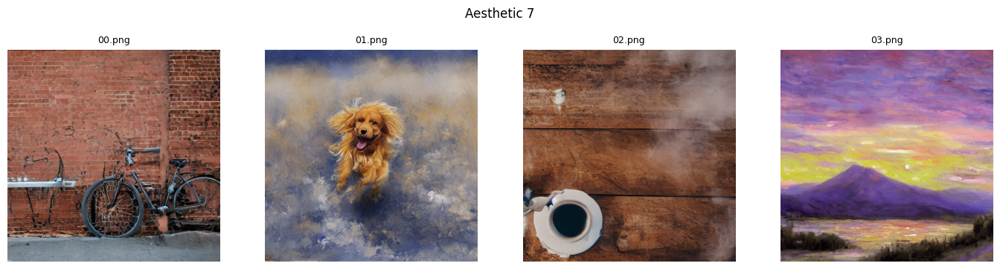

/home/ayagolubkova/rl_project/ddpo-pytorch/report/preview_grids/aesth_7_previews.png


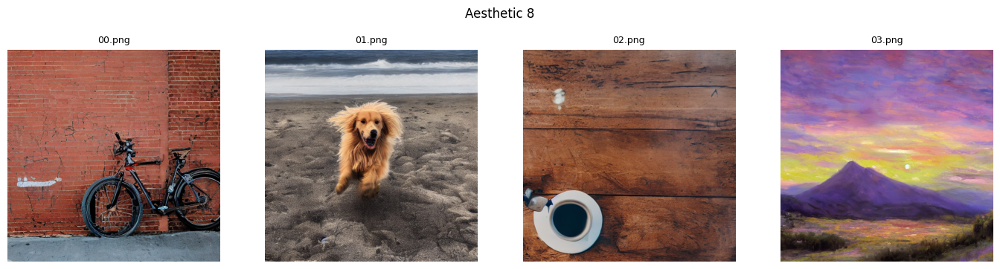

/home/ayagolubkova/rl_project/ddpo-pytorch/report/preview_grids/aesth_8_previews.png


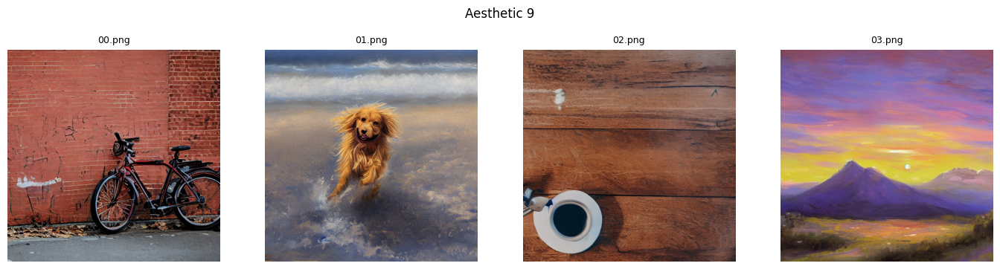

/home/ayagolubkova/rl_project/ddpo-pytorch/report/preview_grids/aesth_9_previews.png


In [ ]:
from PIL import Image

runs_root = Path(path)
preview_out = report_dir / "preview_grids"
preview_out.mkdir(parents=True, exist_ok=True)


def ordered_benchmark_runs():
    def keys(d):
        return sorted(d.keys(), key=natural_sort_key)

    out = []
    out += keys(SD_BASE)
    out += keys(JPEG_AND_AES)
    out += keys(JPEG)
    out += keys(AESTH)
    known = set(SD_BASE) | set(JPEG_AND_AES) | set(JPEG) | set(AESTH)
    rest = []
    for d in sorted(runs_root.iterdir()):
        if d.is_dir() and (d / "results.json").is_file() and d.name not in known:
            rest.append(d.name)
    out += sorted(rest, key=natural_sort_key)
    return out


for run_name in ordered_benchmark_runs():
    prev_dir = runs_root / run_name / "preview"
    if not prev_dir.is_dir():
        print(f"skip (no preview/): {run_name}")
        continue
    fig, axes = plt.subplots(1, 4, figsize=(14, 3.5))
    fig.suptitle(name_of_run[run_name], fontsize=12, y=1.02)
    for i in range(4):
        ax = axes[i]
        p = prev_dir / f"{i:02d}.png"
        if p.is_file():
            ax.imshow(Image.open(p))
        ax.set_title(f"{i:02d}.png", fontsize=9)
        ax.axis("off")
    plt.tight_layout()
    out_png = preview_out / f"{run_name}_previews.png"
    plt.savefig(out_png, dpi=130, bbox_inches="tight")
    plt.show()
    print(out_png)
